In [1]:
import os
import time
import numpy as np
import h5py
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter

import seaborn as sns

from scipy.stats import spearmanr, pearsonr, ranksums


In [2]:
#Load GTEX v8 TPM matrix

tissues = ['blood']

#Define tissue column-to-file mapping
tissue_to_file_dict = {
    'Whole Blood' : 'blood',
}

#Get inverse dictionary lookup
file_to_tissue_dict = {val : key for key, val in tissue_to_file_dict.items()}

#Load TPM matrix
tpm_df = pd.read_csv("/home/jlinder/seqnn/data/diff_expr/GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_median_tpm.gct.gz", sep='\t', compression='gzip', skiprows=2)

#Clean dataframe
tpm_df['gene_id'] = tpm_df['Name']
tpm_df['gene_symbol'] = tpm_df['Description']
tpm_df['gene_base'] = tpm_df['gene_id'].apply(lambda x: x.split(".")[0])

tpm_df = tpm_df.drop_duplicates(subset=['gene_base'], keep='first').copy().reset_index(drop=True)

#Loop over all tissue entries in TPM matrix, truncate outliers and append log2-normalized metric
tissue_cols = []

for tissue_file in tissues :
    
    #Get long name
    tissue = file_to_tissue_dict[tissue_file]
    
    #Rename tissue column
    tpm_df[tissue_to_file_dict[tissue]] = tpm_df[tissue]
    
    tissue_cols.append(tissue_to_file_dict[tissue])

tpm_df = tpm_df[['gene_id', 'gene_base', 'gene_symbol'] + tissue_cols]

tpm_df['gene_base'] = tpm_df['gene_id'].apply(lambda x: x.split('.')[0] if '.' in x else x)
tpm_df = tpm_df.loc[tpm_df['gene_id'].str.contains("ENS")].drop_duplicates(subset=['gene_base'], keep='first').copy().reset_index(drop=True)

tpm_df = tpm_df.rename(columns={"blood" : "tpm_blood"})

print("len(tpm_df) = " + str(len(tpm_df)))


len(tpm_df) = 56156


In [3]:
#Load 5 different K562 gene TPM matrices from ENCODE
#Experiments: ENCSR000AEL, ENCSR000AEM, ENCSR000AEN, ENCSR000AEO, ENCSR000CPH

enc_files = [
    'ENCFF136UBW.tsv',
    'ENCFF222UVT.tsv',
    'ENCFF731FLQ.tsv',
    'ENCFF842EIL.tsv',
    'ENCFF068NRZ.tsv',
]

enc_dfs = []

#Load and accumulate files
for enc_file in enc_files :
    enc_df = pd.read_csv(enc_file, sep='\t')
        
    enc_df['gene_base'] = enc_df['gene_id'].apply(lambda x: x.split('.')[0] if '.' in x else x)
    enc_df = enc_df.loc[enc_df['gene_id'].str.contains("ENS")].drop_duplicates(subset=['gene_base'], keep='first').copy().reset_index(drop=True)
    enc_df = enc_df[['gene_id', 'gene_base', 'TPM']].rename(columns={"TPM" : "tpm_k562"})
    
    enc_dfs.append(enc_df)

#Join against GTEx TPM dataframe
for i in range(len(enc_dfs)) :
    enc_dfs[i] = enc_dfs[i].join(tpm_df[['gene_base', 'gene_symbol', 'tpm_blood']].set_index('gene_base'), on='gene_base', how='inner').copy().reset_index(drop=True)

print("len(enc_dfs[0]) = " + str(len(enc_dfs[0])))
print("len(enc_dfs[1]) = " + str(len(enc_dfs[1])))
print("len(enc_dfs[2]) = " + str(len(enc_dfs[2])))
print("len(enc_dfs[3]) = " + str(len(enc_dfs[3])))
print("len(enc_dfs[4]) = " + str(len(enc_dfs[4])))


len(enc_dfs[0]) = 55849
len(enc_dfs[1]) = 55849
len(enc_dfs[2]) = 55849
len(enc_dfs[3]) = 55849
len(enc_dfs[4]) = 55849


In [4]:
#Get dataframe(s) with only non-zero TPM entries
enc_nonzero_dfs = [
    enc_dfs[i].query("tpm_blood > 0. and tpm_k562 > 0.")[['gene_id', 'gene_base', 'gene_symbol', 'tpm_blood', 'tpm_k562']].copy().reset_index(drop=True)
    for i in range(len(enc_dfs))
]

print("len(enc_nonzero_dfs[0]) = " + str(len(enc_nonzero_dfs[0])))
print("len(enc_nonzero_dfs[1]) = " + str(len(enc_nonzero_dfs[1])))
print("len(enc_nonzero_dfs[2]) = " + str(len(enc_nonzero_dfs[2])))
print("len(enc_nonzero_dfs[3]) = " + str(len(enc_nonzero_dfs[3])))
print("len(enc_nonzero_dfs[4]) = " + str(len(enc_nonzero_dfs[4])))


len(enc_nonzero_dfs[0]) = 16698
len(enc_nonzero_dfs[1]) = 16379
len(enc_nonzero_dfs[2]) = 17247
len(enc_nonzero_dfs[3]) = 17336
len(enc_nonzero_dfs[4]) = 18288


In [5]:
#Compute TPM ranks
for i in range(len(enc_dfs)) :
    enc_dfs[i]['rank_k562'] = np.argsort(np.argsort(enc_dfs[i]['tpm_k562'].values)) / float(len(enc_dfs[i]))
    enc_dfs[i]['rank_blood'] = np.argsort(np.argsort(enc_dfs[i]['tpm_blood'].values)) / float(len(enc_dfs[i]))

#Compute TPM ranks (non-zero only)
for i in range(len(enc_dfs)) :
    enc_nonzero_dfs[i]['rank_k562'] = np.argsort(np.argsort(enc_nonzero_dfs[i]['tpm_k562'].values)) / float(len(enc_nonzero_dfs[i]))
    enc_nonzero_dfs[i]['rank_blood'] = np.argsort(np.argsort(enc_nonzero_dfs[i]['tpm_blood'].values)) / float(len(enc_nonzero_dfs[i]))


ENCODE TPM File = 'ENCSR000AEL'
- (Enriched in K562) -
      gene_symbol  rank_k562  rank_blood
2086        GATA1   0.960774    0.874955
7972         TAL1   0.900228    0.696550
10387       GATA2   0.919691    0.368906

- (Enriched in GTEx Blood) -
     gene_symbol  rank_k562  rank_blood
310        RUNX3   0.106180    0.893341
770         SPI1   0.733561    0.996467
4358        IRF1   0.362978    0.959935
9056        IRF2   0.484729    0.927716
9604       CEBPB   0.811894    0.990837
 - n = 16698
 -- r = 0.618
 -- p = 0.0


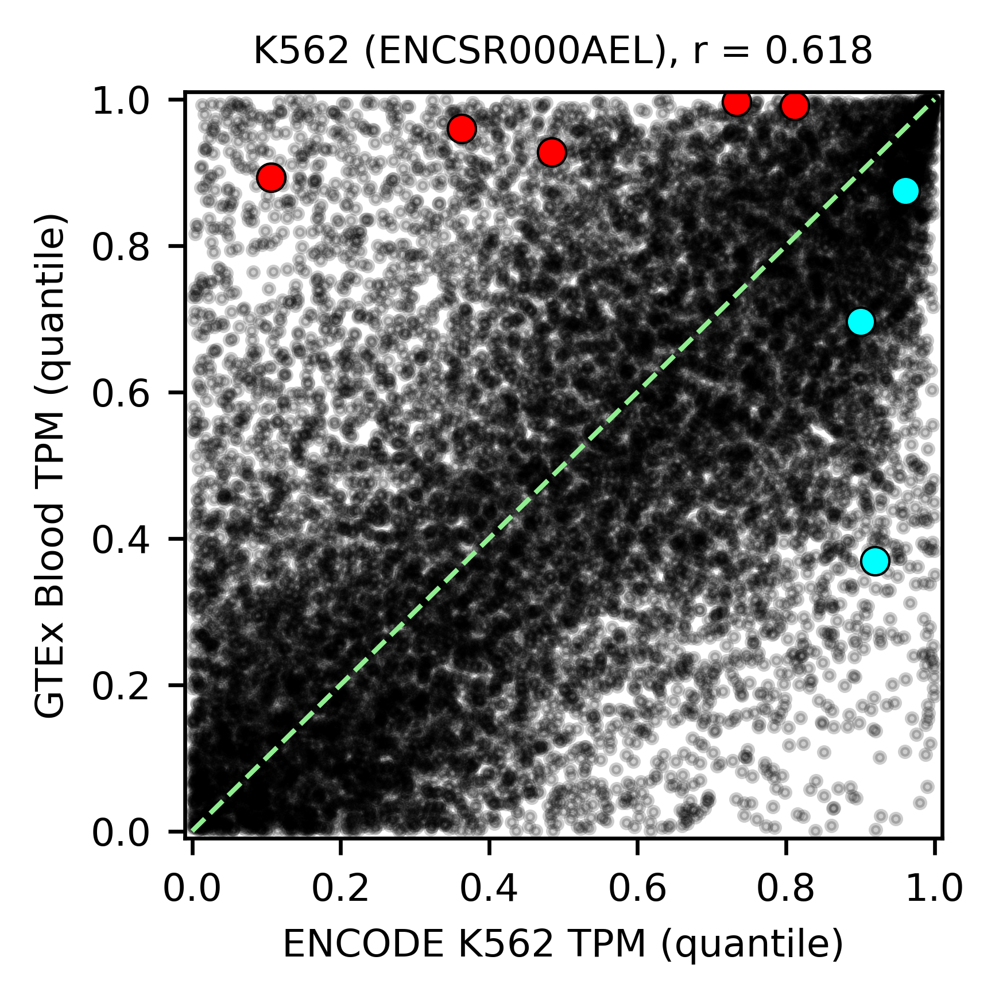

ENCODE TPM File = 'ENCSR000AEM'
- (Enriched in K562) -
      gene_symbol  rank_k562  rank_blood
2092        GATA1   0.950058    0.871726
7999         TAL1   0.792906    0.689175
10399       GATA2   0.909885    0.356005

- (Enriched in GTEx Blood) -
     gene_symbol  rank_k562  rank_blood
316        RUNX3   0.190610    0.890408
784         SPI1   0.580988    0.996215
4370        IRF1   0.417364    0.958300
9084        IRF2   0.482935    0.925514
9623       CEBPB   0.786190    0.990231
 - n = 16379
 -- r = 0.61
 -- p = 0.0


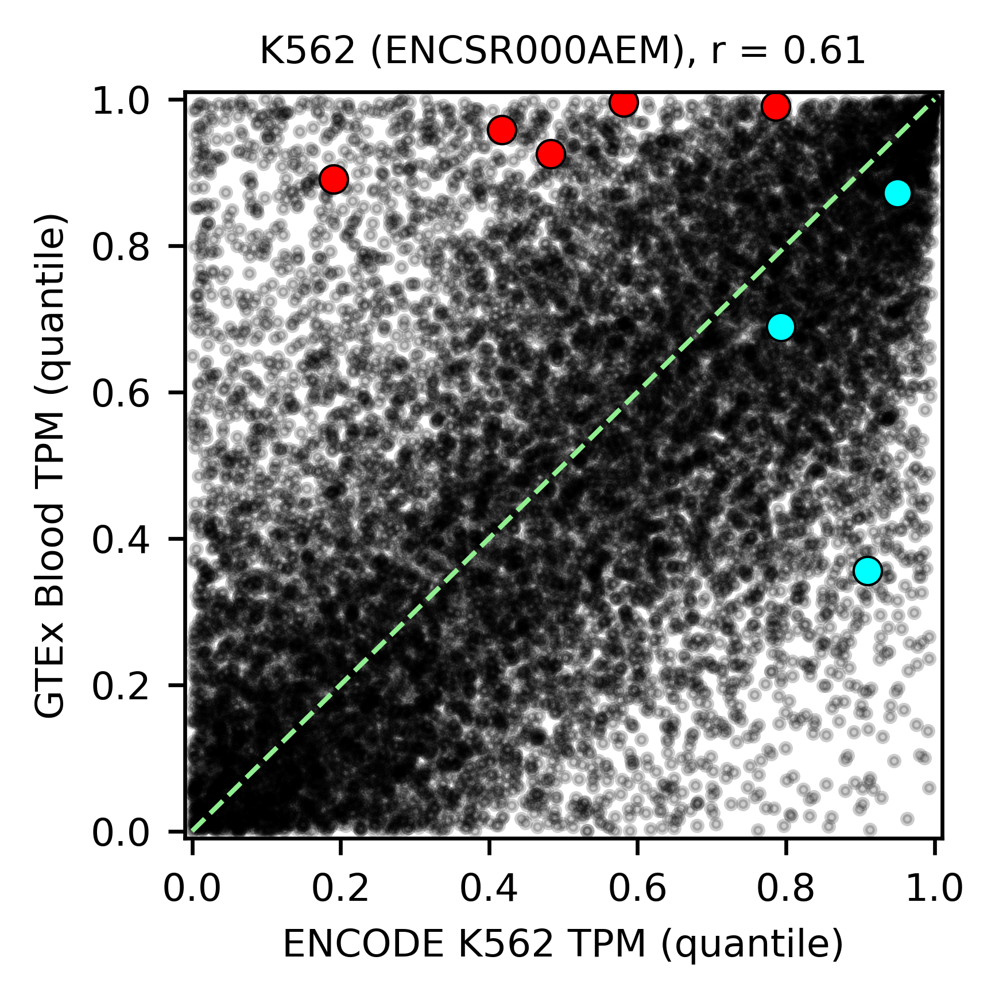

ENCODE TPM File = 'ENCSR000AEN'
- (Enriched in K562) -
      gene_symbol  rank_k562  rank_blood
2081        GATA1   0.809242    0.879051
8048         TAL1   0.866701    0.705572
10481       GATA2   0.754624    0.383487

- (Enriched in GTEx Blood) -
     gene_symbol  rank_k562  rank_blood
307        RUNX3   0.039775    0.896852
772         SPI1   0.410448    0.996521
4376        IRF1   0.448484    0.961211
9144        IRF2   0.585029    0.930133
9693       CEBPB   0.528092    0.991013
 - n = 17247
 -- r = 0.544
 -- p = 0.0


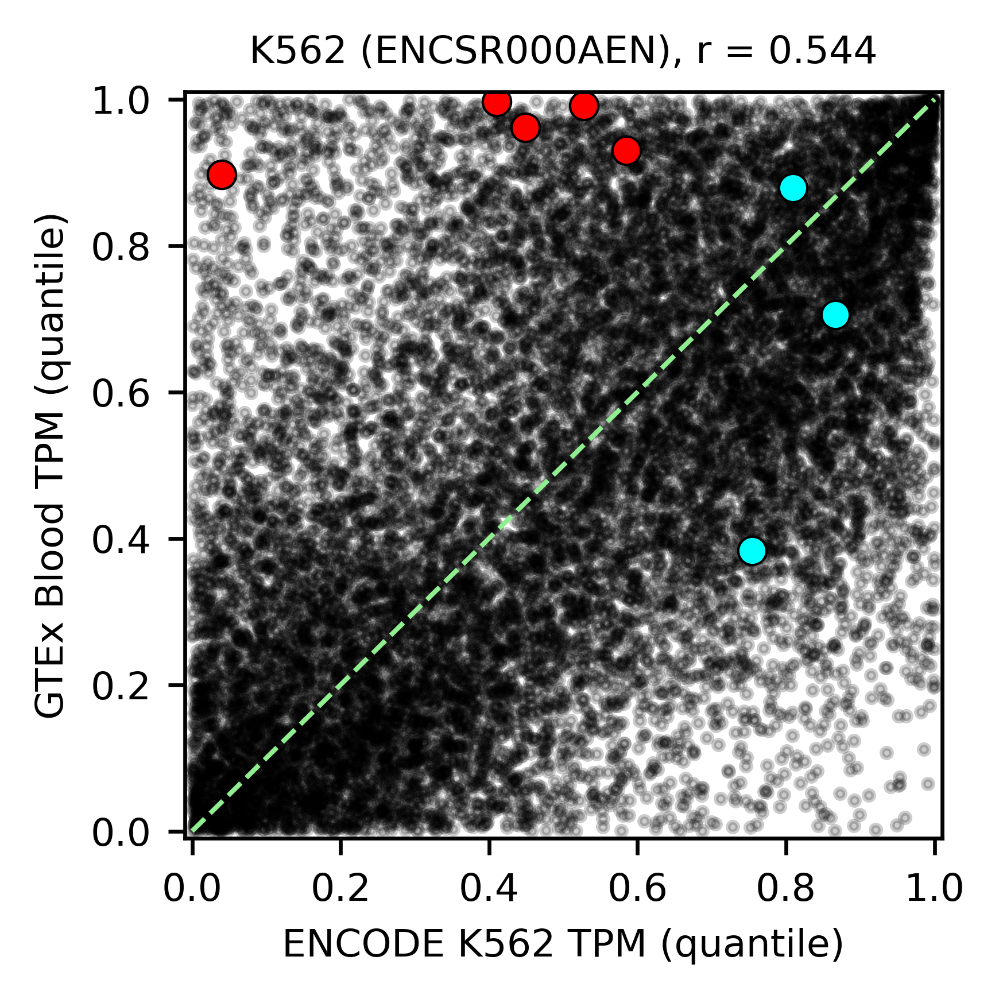

ENCODE TPM File = 'ENCSR000AEO'
- (Enriched in K562) -
      gene_symbol  rank_k562  rank_blood
2153        GATA1   0.967697    0.877134
8299         TAL1   0.858791    0.702815
10838       GATA2   0.920743    0.379326

- (Enriched in GTEx Blood) -
      gene_symbol  rank_k562  rank_blood
330         RUNX3   0.210775    0.894901
807          SPI1   0.725888    0.996481
4518         IRF1   0.439836    0.960314
9441         IRF2   0.552434    0.928588
10010       CEBPB   0.469659    0.990540
 - n = 17336
 -- r = 0.624
 -- p = 0.0


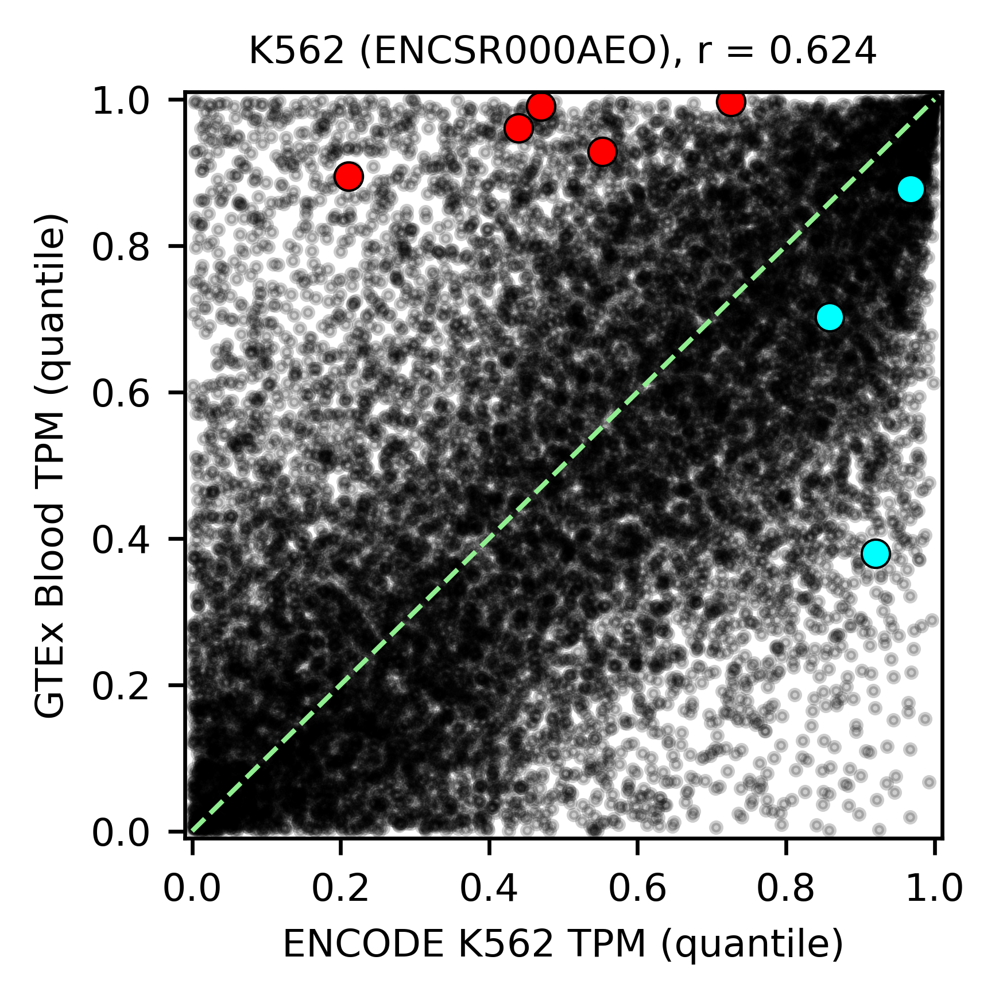

ENCODE TPM File = 'ENCSR000CPH'
- (Enriched in K562) -
      gene_symbol  rank_k562  rank_blood
2189        GATA1   0.870954    0.883038
8438         TAL1   0.824530    0.717246
11027       GATA2   0.728401    0.404418

- (Enriched in GTEx Blood) -
      gene_symbol  rank_k562  rank_blood
328         RUNX3   0.050908    0.900208
809          SPI1   0.531332    0.996555
4587         IRF1   0.475448    0.962052
9598         IRF2   0.571796    0.932360
10183       CEBPB   0.518318    0.991196
 - n = 18288
 -- r = 0.608
 -- p = 0.0


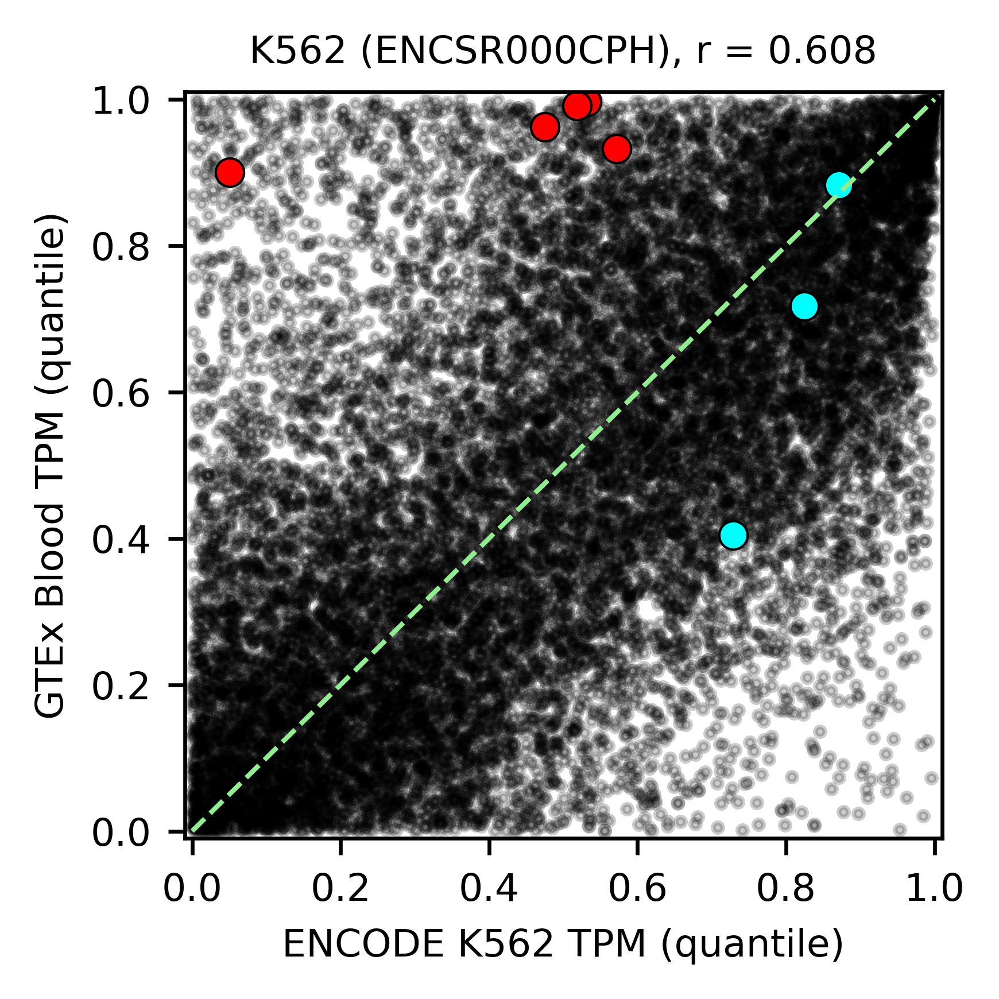

In [6]:
#Visualize TPM quantiles for motifs of interest (blood- / immune-specifc motifs)

save_figs = True

rasterize_dpi = 600

enc_names = ['ENCSR000AEL', 'ENCSR000AEM', 'ENCSR000AEN', 'ENCSR000AEO', 'ENCSR000CPH']

motifs_k562 = ['GATA1', 'GATA2', 'TAL1']
motifs_blood = ['CEBPB', 'SPI1', 'IRF1', 'IRF2', 'RUNX3']

#Loop over ENCODE experiments of K562
for enc_ix, enc_df in enumerate(enc_nonzero_dfs) :
    
    print("ENCODE TPM File = '" + str(enc_names[enc_ix]) + "'")
    
    print("- (Enriched in K562) -")
    print(enc_df.loc[enc_df['gene_symbol'].isin(motifs_k562)][['gene_symbol', 'rank_k562', 'rank_blood']])
    print("")
    print("- (Enriched in GTEx Blood) -")
    print(enc_df.loc[enc_df['gene_symbol'].isin(motifs_blood)][['gene_symbol', 'rank_k562', 'rank_blood']])

    r_val, p_val = spearmanr(enc_df['tpm_k562'], enc_df['tpm_blood'])
    
    print(" - n = " + str(len(enc_df)))
    print(" -- r = " + str(round(r_val, 3)))
    print(" -- p = " + str(p_val))

    f = plt.figure(figsize=(3, 3), dpi=rasterize_dpi)

    plt.scatter(enc_df['rank_k562'], enc_df['rank_blood'], color='black', s=4, alpha=0.2, rasterized=True)
    
    plt.scatter(enc_df.loc[enc_df['gene_symbol'].isin(motifs_k562)]['rank_k562'], enc_df.loc[enc_df['gene_symbol'].isin(motifs_k562)]['rank_blood'], s=35, color='cyan', edgecolor='black', linewidth=0.5)
    plt.scatter(enc_df.loc[enc_df['gene_symbol'].isin(motifs_blood)]['rank_k562'], enc_df.loc[enc_df['gene_symbol'].isin(motifs_blood)]['rank_blood'], s=35, color='red', edgecolor='black', linewidth=0.5)

    plt.plot([0, 1], [0, 1], linewidth=1, linestyle='--', color='lightgreen')
    
    plt.xlim(0-0.01, 1+0.01)
    plt.ylim(0-0.01, 1+0.01)
    
    plt.xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], [0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=8)
    plt.yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], [0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=8)
    
    plt.xlabel("ENCODE K562 TPM (quantile)", fontsize=8)
    plt.ylabel("GTEx Blood TPM (quantile)", fontsize=8)
    
    plt.title("K562 (" + enc_names[enc_ix] + "), r = " + str(round(r_val, 3)), fontsize=8)
    
    plt.tight_layout()
    
    if save_figs :
        plt.savefig("encode_k562_vs_blood_nonzero_tpm_q_" + str(enc_names[enc_ix]) + ".png", dpi=600, transparent=False)
        plt.savefig("encode_k562_vs_blood_nonzero_tpm_q_" + str(enc_names[enc_ix]) + ".pdf")

    plt.show()


Avg K562 rank across ENCODE
- (Enriched in K562) -
     gene_symbol  rank_k562  rank_blood
1983       GATA1   0.950058    0.874955
7568        TAL1   0.858791    0.696550
9829       GATA2   0.909885    0.368906

- (Enriched in GTEx Blood) -
     gene_symbol  rank_k562  rank_blood
293        RUNX3   0.106180    0.893341
731         SPI1   0.580988    0.996467
4150        IRF1   0.439836    0.959935
8597        IRF2   0.552434    0.927716
9102       CEBPB   0.528092    0.990837
 - n = 14937
 -- r = 0.594
 -- p = 0.0


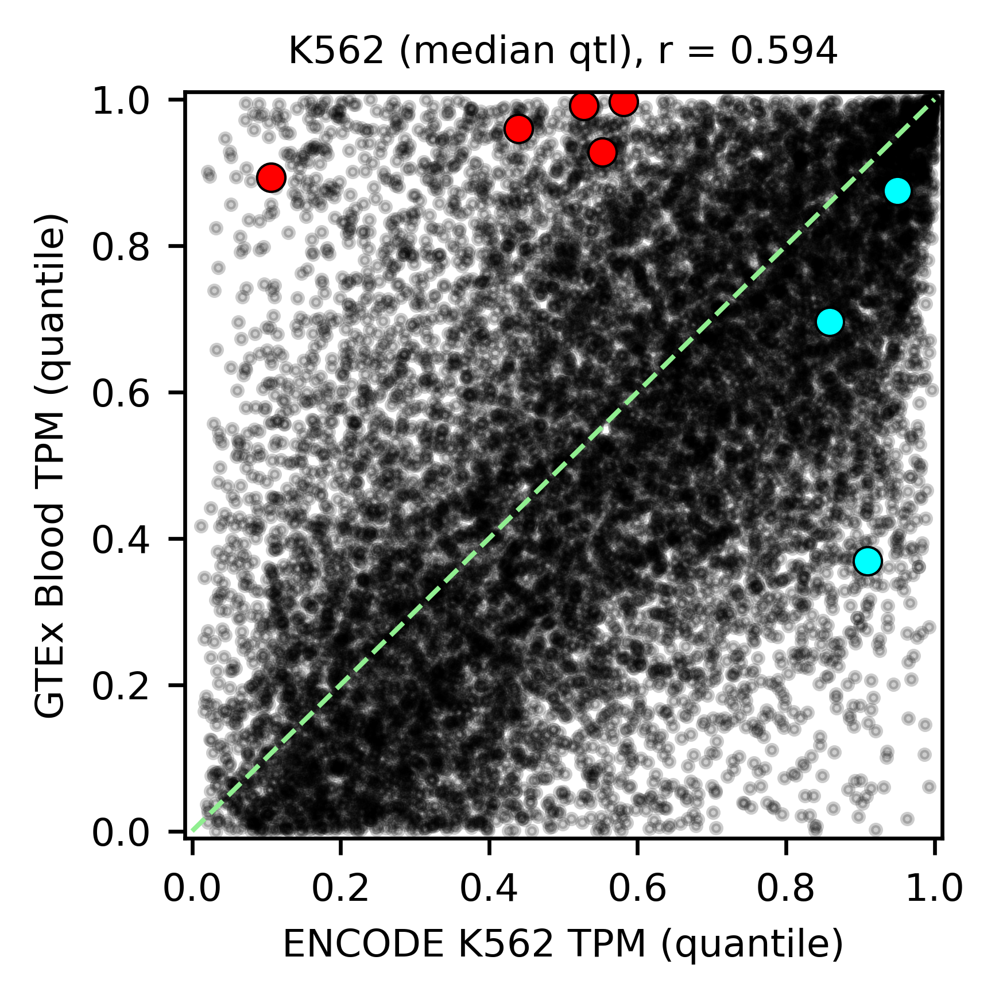

In [7]:
#Visualize TPM quantiles for motifs of interest (blood- / immune-specifc motifs); median rank across K562 experiments

save_figs = True

rasterize_dpi = 600

motifs_k562 = ['GATA1', 'GATA2', 'TAL1']
motifs_blood = ['CEBPB', 'SPI1', 'IRF1', 'IRF2', 'RUNX3']

enc_median_df = enc_nonzero_dfs[0].copy()

#Loop over ENCODE experiments of K562
for enc_ix in range(1, len(enc_dfs)) :
    enc_median_df = enc_median_df.join(enc_nonzero_dfs[enc_ix][['gene_base', 'rank_k562']].set_index('gene_base'), on='gene_base', how='inner', rsuffix='_' + str(enc_ix)).copy().reset_index(drop=True)

enc_median_df = enc_median_df.rename(columns={'rank_k562' : 'rank_k562_0'}).copy()

#Calculate average ranks
median_ranks = []

for _, row in enc_median_df.iterrows() :
    median_ranks.append(np.median([row['rank_k562_' + str(enc_ix)] for enc_ix in range(len(enc_dfs))]))

enc_median_df['rank_k562'] = median_ranks

enc_df = enc_median_df

print("Avg K562 rank across ENCODE")

print("- (Enriched in K562) -")
print(enc_df.loc[enc_df['gene_symbol'].isin(motifs_k562)][['gene_symbol', 'rank_k562', 'rank_blood']])
print("")
print("- (Enriched in GTEx Blood) -")
print(enc_df.loc[enc_df['gene_symbol'].isin(motifs_blood)][['gene_symbol', 'rank_k562', 'rank_blood']])

r_val, p_val = spearmanr(enc_df['tpm_k562'], enc_df['tpm_blood'])

print(" - n = " + str(len(enc_df)))
print(" -- r = " + str(round(r_val, 3)))
print(" -- p = " + str(p_val))

f = plt.figure(figsize=(3, 3), dpi=rasterize_dpi)

plt.scatter(enc_df['rank_k562'], enc_df['rank_blood'], color='black', s=4, alpha=0.2, rasterized=True)

plt.scatter(enc_df.loc[enc_df['gene_symbol'].isin(motifs_k562)]['rank_k562'], enc_df.loc[enc_df['gene_symbol'].isin(motifs_k562)]['rank_blood'], s=35, color='cyan', edgecolor='black', linewidth=0.5)
plt.scatter(enc_df.loc[enc_df['gene_symbol'].isin(motifs_blood)]['rank_k562'], enc_df.loc[enc_df['gene_symbol'].isin(motifs_blood)]['rank_blood'], s=35, color='red', edgecolor='black', linewidth=0.5)

plt.plot([0, 1], [0, 1], linewidth=1, linestyle='--', color='lightgreen')

plt.xlim(0-0.01, 1+0.01)
plt.ylim(0-0.01, 1+0.01)

plt.xticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], [0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=8)
plt.yticks([0.0, 0.2, 0.4, 0.6, 0.8, 1.0], [0.0, 0.2, 0.4, 0.6, 0.8, 1.0], fontsize=8)

plt.xlabel("ENCODE K562 TPM (quantile)", fontsize=8)
plt.ylabel("GTEx Blood TPM (quantile)", fontsize=8)

plt.title("K562 (median qtl), r = " + str(round(r_val, 3)), fontsize=8)

plt.tight_layout()

if save_figs :
    plt.savefig("encode_k562_vs_blood_nonzero_tpm_q_avgrank.png", dpi=600, transparent=False)
    plt.savefig("encode_k562_vs_blood_nonzero_tpm_q_avgrank.pdf")

plt.show()
